## Rover Project Test Notebook
This notebook contains the functions from the lesson and provides the scaffolding you need to test out your mapping methods.  The steps you need to complete in this notebook for the project are the following:

* First just run each of the cells in the notebook, examine the code and the results of each.
* Run the simulator in "Training Mode" and record some data. Note: the simulator may crash if you try to record a large (longer than a few minutes) dataset, but you don't need a ton of data, just some example images to work with.   
* Change the data directory path (2 cells below) to be the directory where you saved data
* Test out the functions provided on your data
* Write new functions (or modify existing ones) to report and map out detections of obstacles and rock samples (yellow rocks)
* Populate the `process_image()` function with the appropriate steps/functions to go from a raw image to a worldmap.
* Run the cell that calls `process_image()` using `moviepy` functions to create video output
* Once you have mapping working, move on to modifying `perception.py` and `decision.py` to allow your rover to navigate and map in autonomous mode!

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

**Run the next cell to get code highlighting in the markdown cells.**

In [1]:
%%HTML
<style> code {background-color : orange !important;} </style>

In [2]:
%matplotlib inline
#%matplotlib qt # Choose %matplotlib qt to plot to an interactive window (note it may show up behind your browser)
# Make some of the relevant imports
import cv2 # OpenCV for perspective transform
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import scipy.misc # For saving images as needed
import glob  # For reading in a list of images from a folder
import imageio
imageio.plugins.ffmpeg.download()


## Quick Look at the Data
There's some example data provided in the `test_dataset` folder.  This basic dataset is enough to get you up and running but if you want to hone your methods more carefully you should record some data of your own to sample various scenarios in the simulator.  

Next, read in and display a random image from the `test_dataset` folder

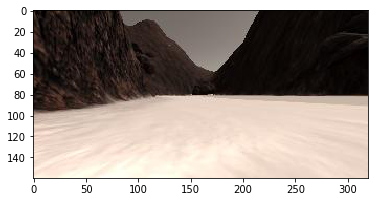

In [3]:
path = '../test_dataset/IMG/*'
img_list = glob.glob(path)
# Grab a random image and display it
idx = np.random.randint(0, len(img_list)-1)
image = mpimg.imread(img_list[idx])
plt.imshow(image)

## Calibration Data
Read in and display example grid and rock sample calibration images.  You'll use the grid for perspective transform and the rock image for creating a new color selection that identifies these samples of interest. 

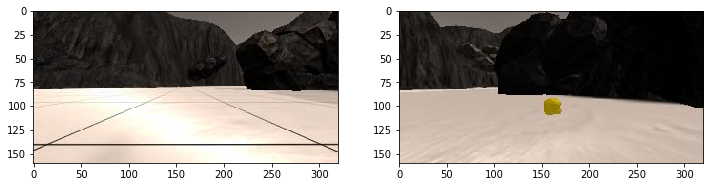

In [4]:
# In the simulator you can toggle on a grid on the ground for calibration
# You can also toggle on the rock samples with the 0 (zero) key.  
# Here's an example of the grid and one of the rocks
example_grid = '../calibration_images/example_grid1.jpg'
example_rock = '../calibration_images/example_rock1.jpg'
grid_img = mpimg.imread(example_grid)
rock_img = mpimg.imread(example_rock)

fig = plt.figure(figsize=(12,3))
plt.subplot(121)
plt.imshow(grid_img)
plt.subplot(122)
plt.imshow(rock_img)

## Perspective Transform

Define the perspective transform function from the lesson and test it on an image.

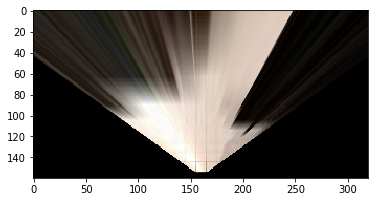

In [5]:
# Define a function to perform a perspective transform
# I've used the example grid image above to choose source points for the
# grid cell in front of the rover (each grid cell is 1 square meter in the sim)
# Define a function to perform a perspective transform
def perspect_transform(img, src, dst):
           
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))# keep same size as input image
    
    return warped


# Define calibration box in source (actual) and destination (desired) coordinates
# These source and destination points are defined to warp the image
# to a grid where each 10x10 pixel square represents 1 square meter
# The destination box will be 2*dst_size on each side
dst_size = 5 
# Set a bottom offset to account for the fact that the bottom of the image 
# is not the position of the rover but a bit in front of it
# this is just a rough guess, feel free to change it!
bottom_offset = 6
source = np.float32([[14, 140], [301 ,140],[200, 96], [118, 96]])
destination = np.float32([[image.shape[1]/2 - dst_size, image.shape[0] - bottom_offset],
                  [image.shape[1]/2 + dst_size, image.shape[0] - bottom_offset],
                  [image.shape[1]/2 + dst_size, image.shape[0] - 2*dst_size - bottom_offset], 
                  [image.shape[1]/2 - dst_size, image.shape[0] - 2*dst_size - bottom_offset],
                  ])
warped = perspect_transform(grid_img, source, destination)
plt.imshow(warped)
#scipy.misc.imsave('../output/warped_example.jpg', warped)

## Color Thresholding
Define the color thresholding function from the lesson and apply it to the warped image

**TODO:** Ultimately, you want your map to not just include navigable terrain but also obstacles and the positions of the rock samples you're searching for.  Modify this function or write a new function that returns the pixel locations of obstacles (areas below the threshold) and rock samples (yellow rocks in calibration images), such that you can map these areas into world coordinates as well.  
**Hints and Suggestion:** 
* For obstacles you can just invert your color selection that you used to detect ground pixels, i.e., if you've decided that everything above the threshold is navigable terrain, then everthing below the threshold must be an obstacle!


* For rocks, think about imposing a lower and upper boundary in your color selection to be more specific about choosing colors.  You can investigate the colors of the rocks (the RGB pixel values) in an interactive matplotlib window to get a feel for the appropriate threshold range (keep in mind you may want different ranges for each of R, G and B!).  Feel free to get creative and even bring in functions from other libraries.  Here's an example of [color selection](http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_colorspaces/py_colorspaces.html) using OpenCV.  

* **Beware However:** if you start manipulating images with OpenCV, keep in mind that it defaults to `BGR` instead of `RGB` color space when reading/writing images, so things can get confusing.

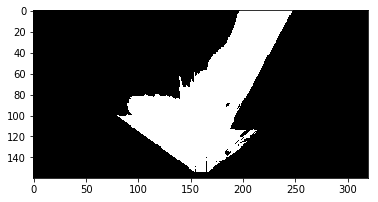

In [6]:
# Identify pixels above the threshold
# Threshold of RGB > 160 does a nice job of identifying ground pixels only
def color_thresh(img, rgb_thresh=(160, 160, 160)):
    # Create an array of zeros same xy size as img, but single channel
    color_select = np.zeros_like(img[:,:,0])
    # Require that each pixel be above all three threshold values in RGB
    # above_thresh will now contain a boolean array with "True"
    # where threshold was met
    above_thresh = (img[:,:,0] > rgb_thresh[0]) \
                & (img[:,:,1] > rgb_thresh[1]) \
                & (img[:,:,2] > rgb_thresh[2])
    # Index the array of zeros with the boolean array and set to 1
    color_select[above_thresh] = 1
    # Return the binary image
    return color_select

threshed = color_thresh(warped)
plt.imshow(threshed, cmap='gray')
#scipy.misc.imsave('../output/warped_threshed.jpg', threshed*255)

## Coordinate Transformations
Define the functions used to do coordinate transforms and apply them to an image.

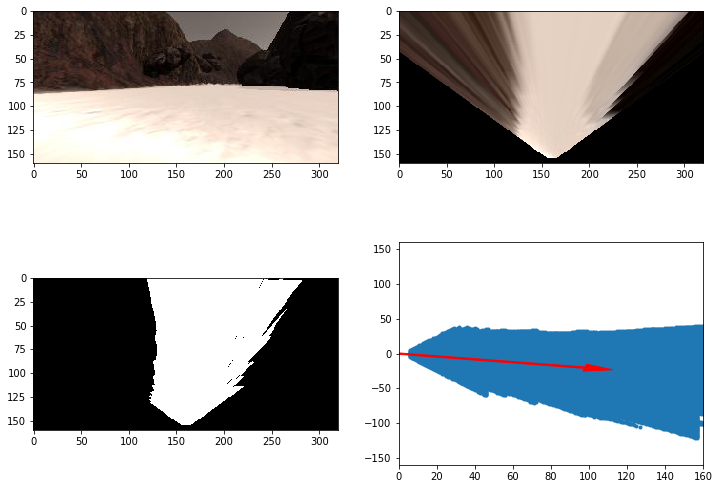

In [7]:
# Define a function to convert from image coords to rover coords
def rover_coords(binary_img):
    # Identify nonzero pixels
    ypos, xpos = binary_img.nonzero()
    # Calculate pixel positions with reference to the rover position being at the 
    # center bottom of the image.  
    x_pixel = -(ypos - binary_img.shape[0]).astype(np.float)
    y_pixel = -(xpos - binary_img.shape[1]/2 ).astype(np.float)
    return x_pixel, y_pixel

# Define a function to convert to radial coords in rover space
def to_polar_coords(x_pixel, y_pixel):
    # Convert (x_pixel, y_pixel) to (distance, angle) 
    # in polar coordinates in rover space
    # Calculate distance to each pixel
    dist = np.sqrt(x_pixel**2 + y_pixel**2)
    # Calculate angle away from vertical for each pixel
    angles = np.arctan2(y_pixel, x_pixel)
    return dist, angles

# Define a function to map rover space pixels to world space
def rotate_pix(xpix, ypix, yaw):
    # Convert yaw to radians
    yaw_rad = yaw * np.pi / 180
    print('yaw_rad =', yaw_rad)
    xpix_rotated = (xpix * np.cos(yaw_rad)) - (ypix * np.sin(yaw_rad))
                            
    ypix_rotated = (xpix * np.sin(yaw_rad)) + (ypix * np.cos(yaw_rad))
    # Return the result  
    return xpix_rotated, ypix_rotated

def translate_pix(xpix_rot, ypix_rot, xpos, ypos, scale): 
    # Apply a scaling and a translation
    xpix_translated = (xpix_rot / scale) + xpos
    ypix_translated = (ypix_rot / scale) + ypos
    # Return the result  
    return xpix_translated, ypix_translated


# Define a function to apply rotation and translation (and clipping)
# Once you define the two functions above this function should work
def pix_to_world(xpix, ypix, xpos, ypos, yaw, world_size, scale):
    # Apply rotation
    xpix_rot, ypix_rot = rotate_pix(xpix, ypix, yaw)
    # Apply translation
    xpix_tran, ypix_tran = translate_pix(xpix_rot, ypix_rot, xpos, ypos, scale)
    # Perform rotation, translation and clipping all at once
    x_pix_world = np.clip(np.int_(xpix_tran), 0, world_size - 1)
    y_pix_world = np.clip(np.int_(ypix_tran), 0, world_size - 1)
    # Return the result
    return x_pix_world, y_pix_world

# Grab another random image
idx = np.random.randint(0, len(img_list)-1)
image = mpimg.imread(img_list[idx])
warped = perspect_transform(image, source, destination)
threshed = color_thresh(warped)

# Calculate pixel values in rover-centric coords and distance/angle to all pixels
xpix, ypix = rover_coords(threshed)
dist, angles = to_polar_coords(xpix, ypix)
mean_dir = np.mean(angles)

# Do some plotting
fig = plt.figure(figsize=(12,9))
plt.subplot(221)
plt.imshow(image)
plt.subplot(222)
plt.imshow(warped)
plt.subplot(223)
plt.imshow(threshed, cmap='gray')
plt.subplot(224)
plt.plot(xpix, ypix, '.')
plt.ylim(-160, 160)
plt.xlim(0, 160)
arrow_length = 100
x_arrow = arrow_length * np.cos(mean_dir)
y_arrow = arrow_length * np.sin(mean_dir)
plt.arrow(0, 0, x_arrow, y_arrow, color='red', zorder=2, head_width=10, width=2)



## Read in saved data and ground truth map of the world
The next cell is all setup to read your saved data into a `pandas` dataframe.  Here you'll also read in a "ground truth" map of the world, where white pixels (pixel value = 1) represent navigable terrain.  

After that, we'll define a class to store telemetry data and pathnames to images.  When you instantiate this class (`data = Databucket()`) you'll have a global variable called `data` that you can refer to for telemetry and map data within the `process_image()` function in the following cell.  


In [8]:
# Import pandas and read in csv file as a dataframe
import pandas as pd
# Change the path below to your data directory
# If you are in a locale (e.g., Europe) that uses ',' as the decimal separator
# change the '.' to ','
df = pd.read_csv('../test_dataset/robot_log.csv', delimiter=';', decimal='.')
csv_img_list = df["Path"].tolist() # Create list of image pathnames
# Read in ground truth map and create a 3-channel image with it
ground_truth = mpimg.imread('../calibration_images/map_bw.png')
ground_truth_3d = np.dstack((ground_truth*0, ground_truth*255, ground_truth*0)).astype(np.float)

# Creating a class to be the data container
# Will read in saved data from csv file and populate this object
# Worldmap is instantiated as 200 x 200 grids corresponding 
# to a 200m x 200m space (same size as the ground truth map: 200 x 200 pixels)
# This encompasses the full range of output position values in x and y from the sim
class Databucket():
    def __init__(self):
        self.images = csv_img_list  
        self.xpos = df["X_Position"].values
        self.ypos = df["Y_Position"].values
        self.yaw = df["Yaw"].values
        self.count = 0 # This will be a running index
        self.worldmap = np.zeros((200, 200, 3)).astype(np.float)
        self.ground_truth = ground_truth_3d # Ground truth worldmap

# Instantiate a Databucket().. this will be a global variable/object
# that you can refer to in the process_image() function below
data = Databucket()


## Write a function to process stored images

Modify the `process_image()` function below by adding in the perception step processes (functions defined above) to perform image analysis and mapping.  The following cell is all set up to use this `process_image()` function in conjunction with the `moviepy` video processing package to create a video from the images you saved taking data in the simulator.  

In short, you will be passing individual images into `process_image()` and building up an image called `output_image` that will be stored as one frame of video.  You can make a mosaic of the various steps of your analysis process and add text as you like (example provided below).  



To start with, you can simply run the next three cells to see what happens, but then go ahead and modify them such that the output video demonstrates your mapping process.  Feel free to get creative!

In [98]:

# Define a function to pass stored images to
# reading rover position and yaw angle from csv file
# This function will be used by moviepy to create an output video
def process_image(img):
    # Example of how to use the Databucket() object defined above
    # to print the current x, y and yaw values 
    print(data.xpos[data.count], data.ypos[data.count], data.yaw[data.count])

    # TODO: 
    #************ 1) Define source and destination points for perspective transform *******************************************
    
    # Define calibration box in source (actual) and destination (desired) coordinates
    # These source and destination points are defined to warp the image
    # to a grid where each 10x10 pixel square represents 1 square meter
    # The destination box will be 2*dst_size on each side
    dst_size = 5 
    # Set a bottom offset to account for the fact that the bottom of the image 
    # is not the position of the rover but a bit in front of it
    # this is just a rough guess, feel free to change it!
    bottom_offset = 6
    source = np.float32([[14, 140], [301 ,140],[200, 96], [118, 96]])
    destination = np.float32([[image.shape[1]/2 - dst_size, image.shape[0] - bottom_offset],
                      [image.shape[1]/2 + dst_size, image.shape[0] - bottom_offset],
                      [image.shape[1]/2 + dst_size, image.shape[0] - 2*dst_size - bottom_offset], 
                      [image.shape[1]/2 - dst_size, image.shape[0] - 2*dst_size - bottom_offset],
                      ])
    
    #************ 2) Apply perspective transform ******************************************************************************
    
    warped = perspect_transform(img, source, destination)
    
    
    #************ 3) Apply color threshold to identify navigable terrain/obstacles/rock samples *******************************
    
    # rgb_thresh for ground & obstacles
    rgb_thresh=(160, 160, 160)
    
    # Create an array of zeros same xy size as img, but single channel
    color_select = np.zeros_like(warped[:,:,0])
    
    # Require that each pixel be above all three threshold values in RGB
    # above_rgb_thresh will now contain a boolean array with "True"
    # where threshold was met
    above_rgb_thresh = (warped[:,:,0] > rgb_thresh[0]) \
                   & (warped[:,:,1] > rgb_thresh[1]) \
                    & (warped[:,:,2] > rgb_thresh[2])
    # Index the array of zeros with the boolean array and set to 1 where rgb threshold was exceeded
    color_select[above_rgb_thresh] = 1
    
    #Rock Sample Thresh
    rock_thresh=(100,100,20)
    
    # Create an array of zeros for rocks same xy size as img, but another single channel
    rock_select = np.zeros_like(img[:,:,0])
    
    # Require that each pixel be above the red and green threshhold values
    # and below the blue threshold value
    in_rock_thresh = (warped[:,:,0] > rock_thresh[0]) \
                    & (warped[:,:,1] > rock_thresh[1]) \
                    & (warped[:,:,2] < rock_thresh[2])
            
    
    # Index the array of zeros with the boolean array and set to 2 where rock rgb threshold was exceeded/met
    rock_select[in_rock_thresh] = 2
    
    # Add color_select and rock_select arrays
    terrain_obstacle_rock = color_select + rock_select
    
    
    #************* 4) Convert thresholded image pixel values to rover-centric coords ******************************************
    
    xpix, ypix = rover_coords(terrain_obstacle_rock)
            
    
    #************* 5) Convert rover-centric pixel values to world coords ******************************************************
    
    # get xpos and ypos for pix_to_world
    #ypos, xpos = terrain_obstacle_rock.nonzero()
    #set xpos and ypos of rover to random coordinates on the world map
    #xpos = np.random.random(1)*160 + 20
    #ypos = np.random.random(1)*160 + 20
    
    # get xpos and ypos from the csv file
    xpos = data.xpos[data.count]
    ypos = data.ypos[data.count]
    
    # get yaw for pix_to_world --> Generate a random number between 0 and 360
    # get yaw from the csv file
    rover_yaw = data.yaw[data.count]
    print('rover_yaw =',rover_yaw)
    
    # get world_size for pix_to_world --> Generate an array of zeros of chosen size 200 by 200. Will pass worldmap.shape[0]
    # into the pix_to_world function
    worldmap = np.zeros((200, 200))
    
    # get scale for pix_to_world --> assuming a scale of 10
    scale = 10
    
    # run the pix_to_world function to apply rotation, translation, and clipping to the image to world coordinates
    x_pix_world, y_pix_world = pix_to_world(xpix, ypix, xpos, ypos, rover_yaw, worldmap.shape[0], scale)
    
    
    # Add the pixel positions seen in the image to the world map
    worldmap[y_pix_world, x_pix_world] += 1
    
    
    # Plot some things for verification
    fig = plt.figure(figsize=(12,12))
    plt.subplot(331)
    plt.imshow(img)
    plt.subplot(332)
    plt.imshow(color_select, cmap='gray')
    plt.subplot(333)
    plt.imshow(rock_select, cmap='gray')
    plt.subplot(334)
    plt.imshow(terrain_obstacle_rock, cmap='gray')
    plt.subplot(335)
    plt.plot(xpix, ypix, '.')
    plt.subplot(336)
    plt.imshow(worldmap, cmap='gray')
    
    
    #************* 6) Update worldmap (to be displayed on right side of screen) ***********************************************
    # Example: 
    #data.worldmap[obstacle_y_world, obstacle_x_world, 0] += 1
    #data.worldmap[rock_y_world, rock_x_world, 1] += 1
    #data.worldmap[navigable_y_world, navigable_x_world, 2] += 1

    #************* 7) Make a mosaic image, below is some example code *********************************************************
        # First create a blank image (can be whatever shape you like)
    output_image = np.zeros((img.shape[0] + data.worldmap.shape[0], img.shape[1]*2, 3))
        # Next you can populate regions of the image with various output
        # Here I'm putting the original image in the upper left hand corner
    output_image[0:img.shape[0], 0:img.shape[1]] = img

        # Let's create more images to add to the mosaic, first a warped image
    warped = perspect_transform(img, source, destination)
        # Add the warped image in the upper right hand corner
    output_image[0:img.shape[0], img.shape[1]:] = warped

        # Overlay worldmap with ground truth map
    map_add = cv2.addWeighted(data.worldmap, 1, data.ground_truth, 0.5, 0)
        # Flip map overlay so y-axis points upward and add to output_image 
    output_image[img.shape[0]:, 0:data.worldmap.shape[1]] = np.flipud(map_add)


        # Then putting some text over the image
    cv2.putText(output_image,"Populate this image with your analyses to make a video!", (20, 20), 
                cv2.FONT_HERSHEY_COMPLEX, 0.4, (255, 255, 255), 1)
    
    
    # increment data.count
    if data.count < len(data.images) - 1:
        data.count += 1 # Keep track of the index in the Databucket()
        
    print("data.count =", data.count)
    
    return output_image

## Make a video from processed image data
Use the [moviepy](https://zulko.github.io/moviepy/) library to process images and create a video.
  

132.2827 104.8689 36.71686
rover_yaw = 36.71686
yaw_rad = 0.6408300979938051
data.count = 282


array([[[22., 18., 15.],
        [30., 26., 23.],
        [40., 36., 33.],
        ...,
        [ 3.,  3.,  3.],
        [ 3.,  3.,  3.],
        [ 3.,  3.,  3.]],

       [[23., 19., 16.],
        [29., 25., 22.],
        [39., 35., 32.],
        ...,
        [ 3.,  3.,  3.],
        [ 3.,  3.,  3.],
        [ 2.,  2.,  2.]],

       [[25., 21., 18.],
        [28., 24., 21.],
        [36., 32., 29.],
        ...,
        [ 3.,  3.,  3.],
        [ 2.,  2.,  2.],
        [ 1.,  1.,  1.]],

       ...,

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.]],

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.]],

       [[ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.],
        [ 0.,  0.,  0.]]

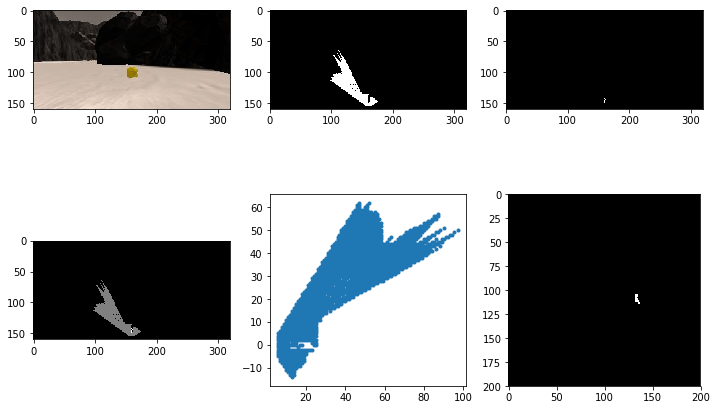

In [99]:
example_grid = '../calibration_images/example_grid1.jpg'
example_rock = '../calibration_images/example_rock1.jpg'
grid_img = mpimg.imread(example_grid)
rock_img = mpimg.imread(example_rock)

process_image(rock_img)

99.66999 85.58896999999999 56.82555
rover_yaw = [58.14332592]
yaw_rad = [1.01479248]
data.count = 1
[MoviePy] >>>> Building video ../output/test_mapping.mp4
[MoviePy] Writing video ../output/test_mapping.mp4


  0%|                                                                                | 0/283 [00:00<?, ?it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [88.92171385]
yaw_rad = [1.55197668]
data.count = 2


  0%|▎                                                                       | 1/283 [00:00<00:51,  5.44it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [311.70212612]
yaw_rad = [5.44022839]
data.count = 3


  1%|▌                                                                       | 2/283 [00:00<00:50,  5.54it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [265.46659425]
yaw_rad = [4.63326612]
data.count = 4


  1%|▊                                                                       | 3/283 [00:00<00:51,  5.47it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [30.55623525]
yaw_rad = [0.53330691]
data.count = 5


  1%|█                                                                       | 4/283 [00:00<00:51,  5.40it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [54.95015289]
yaw_rad = [0.95906109]
data.count = 6


  2%|█▎                                                                      | 5/283 [00:00<00:53,  5.22it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [323.68348556]
yaw_rad = [5.64934256]
data.count = 7


  2%|█▌                                                                      | 6/283 [00:01<00:51,  5.33it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [113.4867103]
yaw_rad = [1.98071675]
data.count = 8


  2%|█▊                                                                      | 7/283 [00:01<00:49,  5.53it/s]

99.66999 85.58896999999999 56.82555
rover_yaw = [210.34384134]
yaw_rad = [3.67119259]
data.count = 9


  3%|██                                                                      | 8/283 [00:01<00:48,  5.62it/s]

99.67065 85.58999 56.82556999999999
rover_yaw = [71.41843229]
yaw_rad = [1.24648679]
data.count = 10


  3%|██▎                                                                     | 9/283 [00:01<00:51,  5.35it/s]

99.67067 85.59003 56.825419999999994
rover_yaw = [215.76936421]
yaw_rad = [3.76588583]
data.count = 11


  4%|██▌                                                                    | 10/283 [00:01<00:48,  5.57it/s]

99.67067 85.59003 56.825419999999994
rover_yaw = [66.86310314]
yaw_rad = [1.1669813]
data.count = 12


  4%|██▊                                                                    | 11/283 [00:01<00:47,  5.68it/s]

99.67066 85.59003 56.825419999999994
rover_yaw = [317.05744902]
yaw_rad = [5.5336964]
data.count = 13


  4%|███                                                                    | 12/283 [00:02<00:47,  5.65it/s]

99.67066 85.59003 56.825419999999994
rover_yaw = [259.75256569]
yaw_rad = [4.53353751]
data.count = 14


  5%|███▎                                                                   | 13/283 [00:02<00:46,  5.76it/s]

99.67065 85.59003 56.825419999999994
rover_yaw = [45.42739781]
yaw_rad = [0.79285766]
data.count = 15


  5%|███▌                                                                   | 14/283 [00:02<00:45,  5.88it/s]

99.67065 85.59003 56.82541
rover_yaw = [295.78436645]
yaw_rad = [5.16241107]
data.count = 16


  5%|███▊                                                                   | 15/283 [00:02<00:45,  5.86it/s]

99.67064 85.59003 56.82541
rover_yaw = [124.0318613]
yaw_rad = [2.16476436]
data.count = 17


  6%|████                                                                   | 16/283 [00:02<00:46,  5.77it/s]

99.67064 85.59003 56.82541
rover_yaw = [210.71847843]
yaw_rad = [3.67773124]
data.count = 18


  6%|████▎                                                                  | 17/283 [00:03<00:44,  5.93it/s]

99.67063 85.59003 56.82541
rover_yaw = [106.05621752]
yaw_rad = [1.85103019]
data.count = 19


  6%|████▌                                                                  | 18/283 [00:03<00:43,  6.03it/s]

99.67062 85.59003 56.82541
rover_yaw = [345.0309573]
yaw_rad = [6.02192623]
data.count = 20


  7%|████▊                                                                  | 19/283 [00:03<00:43,  6.12it/s]

99.67062 85.59003 56.82541
rover_yaw = [123.582029]
yaw_rad = [2.1569133]
data.count = 21


  7%|█████                                                                  | 20/283 [00:03<00:44,  5.97it/s]

99.67062 85.59004 56.8254
rover_yaw = [61.58428572]
yaw_rad = [1.07484855]
data.count = 22


  7%|█████▎                                                                 | 21/283 [00:03<00:43,  6.03it/s]

99.67062 85.59005 56.8254
rover_yaw = [3.30293467]
yaw_rad = [0.05764708]
data.count = 23


  8%|█████▌                                                                 | 22/283 [00:03<00:43,  6.06it/s]

99.67062 85.59005 56.8254
rover_yaw = [118.67425039]
yaw_rad = [2.07125641]
data.count = 24


  8%|█████▊                                                                 | 23/283 [00:03<00:43,  6.04it/s]

99.6708 85.59031999999999 56.82637
rover_yaw = [204.3029538]
yaw_rad = [3.56575922]
data.count = 25


  8%|██████                                                                 | 24/283 [00:04<00:42,  6.04it/s]

99.67083000000001 85.59038000000001 56.81548000000001
rover_yaw = [44.67564636]
yaw_rad = [0.77973712]
data.count = 26


  9%|██████▎                                                                | 25/283 [00:04<00:43,  5.87it/s]

99.67175999999999 85.5918 56.8225
rover_yaw = [326.07333089]
yaw_rad = [5.69105323]
data.count = 27


  9%|██████▌                                                                | 26/283 [00:04<00:43,  5.96it/s]

99.67331999999999 85.59421 56.715019999999996
rover_yaw = [227.95248921]
yaw_rad = [3.97852147]
data.count = 28


 10%|██████▊                                                                | 27/283 [00:04<00:42,  6.04it/s]

99.67529 85.59719 56.69259
rover_yaw = [333.83921868]
yaw_rad = [5.82659354]
data.count = 29


 10%|███████                                                                | 28/283 [00:04<00:43,  5.86it/s]

99.67777 85.60096 56.73291
rover_yaw = [313.23568877]
yaw_rad = [5.4669941]
data.count = 30


 10%|███████▎                                                               | 29/283 [00:05<00:42,  6.00it/s]

99.68341 85.6096 56.871809999999996
rover_yaw = [171.88519054]
yaw_rad = [2.99996251]
data.count = 31


 11%|███████▌                                                               | 30/283 [00:05<00:42,  5.89it/s]

99.68764 85.61605 56.75683000000001
rover_yaw = [275.87141523]
yaw_rad = [4.81486451]
data.count = 32


 11%|███████▊                                                               | 31/283 [00:05<00:42,  5.94it/s]

99.69625 85.62921999999999 56.750859999999996
rover_yaw = [353.37823103]
yaw_rad = [6.16761364]
data.count = 33


 11%|████████                                                               | 32/283 [00:05<00:42,  5.89it/s]

99.70283 85.63936 56.889109999999995
rover_yaw = [346.22498363]
yaw_rad = [6.04276592]
data.count = 34


 12%|████████▎                                                              | 33/283 [00:05<00:41,  5.98it/s]

99.71024 85.65078000000001 56.9262
rover_yaw = [6.77158544]
yaw_rad = [0.11818646]
data.count = 35


 12%|████████▌                                                              | 34/283 [00:05<00:41,  5.96it/s]

99.71786999999999 85.66252 56.97526
rover_yaw = [279.06223819]
yaw_rad = [4.87055487]
data.count = 36


 12%|████████▊                                                              | 35/283 [00:06<00:41,  5.98it/s]

99.72574 85.67455 57.014480000000006
rover_yaw = [186.55214692]
yaw_rad = [3.25594919]
data.count = 37


 13%|█████████                                                              | 36/283 [00:06<00:40,  6.06it/s]

99.73706999999999 85.69167 56.986019999999996
rover_yaw = [129.41717172]
yaw_rad = [2.25875576]
data.count = 38


 13%|█████████▎                                                             | 37/283 [00:06<00:40,  6.06it/s]

99.74576 85.70506 56.935390000000005
rover_yaw = [305.06561509]
yaw_rad = [5.32439942]
data.count = 39


 13%|█████████▌                                                             | 38/283 [00:06<00:40,  6.12it/s]

99.76088 85.72845 56.8792
rover_yaw = [70.7690398]
yaw_rad = [1.23515275]
data.count = 40


 14%|█████████▊                                                             | 39/283 [00:06<00:39,  6.14it/s]

99.77776 85.75455 56.884809999999995
rover_yaw = [36.49680252]
yaw_rad = [0.63698937]
data.count = 41


 14%|██████████                                                             | 40/283 [00:06<00:39,  6.13it/s]

99.79700000000001 85.78428000000001 56.86581999999999
rover_yaw = [209.48751123]
yaw_rad = [3.65624681]
data.count = 42


 14%|██████████▎                                                            | 41/283 [00:06<00:40,  6.04it/s]

99.81023 85.8047 56.835519999999995
rover_yaw = [19.08258985]
yaw_rad = [0.33305402]
data.count = 43


 15%|██████████▌                                                            | 42/283 [00:07<00:39,  6.11it/s]

99.83139 85.83752 56.96938000000001
rover_yaw = [161.84087666]
yaw_rad = [2.82465616]
data.count = 44


 15%|██████████▊                                                            | 43/283 [00:07<00:39,  6.08it/s]

99.84605 85.86028 57.063869999999994
rover_yaw = [139.06533816]
yaw_rad = [2.42714803]
data.count = 45


 16%|███████████                                                            | 44/283 [00:07<00:39,  6.02it/s]

99.86151 85.88438000000001 57.10579
rover_yaw = [100.27118014]
yaw_rad = [1.75006224]
data.count = 46


 16%|███████████▎                                                           | 45/283 [00:07<00:39,  6.00it/s]

99.87763000000001 85.90944 57.08944
rover_yaw = [127.9997975]
yaw_rad = [2.23401791]
data.count = 47


 16%|███████████▌                                                           | 46/283 [00:07<00:39,  6.03it/s]

99.90364 85.94996 57.10592
rover_yaw = [210.46236749]
yaw_rad = [3.67326126]
data.count = 48


 17%|███████████▊                                                           | 47/283 [00:07<00:38,  6.08it/s]

99.92182 85.9783 57.13094
rover_yaw = [33.24603256]
yaw_rad = [0.58025273]
data.count = 49


 17%|████████████                                                           | 48/283 [00:08<00:39,  6.02it/s]

99.95082 86.02351 57.156780000000005
rover_yaw = [345.89195306]
yaw_rad = [6.03695344]
data.count = 50


 17%|████████████▎                                                          | 49/283 [00:08<00:38,  6.04it/s]

99.97074 86.05458 57.21354
rover_yaw = [215.46879805]
yaw_rad = [3.76063996]
data.count = 51


 18%|████████████▌                                                          | 50/283 [00:08<00:38,  6.06it/s]

99.99143000000001 86.08694 57.22939
rover_yaw = [310.19247936]
yaw_rad = [5.41388008]
data.count = 52


 18%|████████████▊                                                          | 51/283 [00:08<00:38,  6.08it/s]

100.0236 86.13731 57.23721
rover_yaw = [50.24283494]
yaw_rad = [0.8769029]
data.count = 53


 18%|█████████████                                                          | 52/283 [00:08<00:38,  6.03it/s]

100.0459 86.17214 57.2653
rover_yaw = [69.01227347]
yaw_rad = [1.2044914]
data.count = 54


 19%|█████████████▎                                                         | 53/283 [00:08<00:38,  5.91it/s]

100.0807 86.22678 57.22249
rover_yaw = [226.64958781]
yaw_rad = [3.95578156]
data.count = 55


 19%|█████████████▌                                                         | 54/283 [00:09<00:38,  5.95it/s]

100.1048 86.26463000000001 57.227819999999994
rover_yaw = [282.47085232]
yaw_rad = [4.93004641]
data.count = 56


 19%|█████████████▊                                                         | 55/283 [00:09<00:38,  5.90it/s]

100.1422 86.32311999999999 57.256009999999996
rover_yaw = [206.03717275]
yaw_rad = [3.59602705]
data.count = 57


 20%|██████████████                                                         | 56/283 [00:09<00:37,  5.99it/s]

100.1679 86.36343000000001 57.274930000000005
rover_yaw = [348.34676999]
yaw_rad = [6.07979807]
data.count = 58


 20%|██████████████▎                                                        | 57/283 [00:09<00:37,  6.03it/s]

100.2078 86.42599 57.31474
rover_yaw = [106.25283567]
yaw_rad = [1.85446182]
data.count = 59


 20%|██████████████▌                                                        | 58/283 [00:09<00:37,  6.06it/s]

100.2352 86.469 57.33373
rover_yaw = [27.78884463]
yaw_rad = [0.48500683]
data.count = 60


 21%|██████████████▊                                                        | 59/283 [00:09<00:37,  5.90it/s]

100.2775 86.53555 57.359790000000004
rover_yaw = [127.54357862]
yaw_rad = [2.22605539]
data.count = 61


 21%|███████████████                                                        | 60/283 [00:10<00:38,  5.82it/s]

100.3065 86.58121 57.36985
rover_yaw = [246.44253313]
yaw_rad = [4.30123362]
data.count = 62


 22%|███████████████▎                                                       | 61/283 [00:10<00:37,  5.86it/s]

100.3362 86.62803000000001 57.3862
rover_yaw = [199.88887244]
yaw_rad = [3.48871896]
data.count = 63


 22%|███████████████▌                                                       | 62/283 [00:10<00:38,  5.75it/s]

100.382 86.7002 57.402919999999995
rover_yaw = [50.40783897]
yaw_rad = [0.87978276]
data.count = 64


 22%|███████████████▊                                                       | 63/283 [00:10<00:39,  5.63it/s]

100.4134 86.7497 57.41326
rover_yaw = [267.13349257]
yaw_rad = [4.66235899]
data.count = 65


 23%|████████████████                                                       | 64/283 [00:10<00:38,  5.62it/s]

100.4454 86.80023 57.42235
rover_yaw = [245.16714629]
yaw_rad = [4.27897392]
data.count = 66


 23%|████████████████▎                                                      | 65/283 [00:11<00:38,  5.63it/s]

100.4947 86.87801 57.43326999999999
rover_yaw = [72.04353526]
yaw_rad = [1.2573969]
data.count = 67


 23%|████████████████▌                                                      | 66/283 [00:11<00:38,  5.70it/s]

100.5284 86.93118 57.441309999999994
rover_yaw = [347.88616394]
yaw_rad = [6.07175898]
data.count = 68


 24%|████████████████▊                                                      | 67/283 [00:11<00:37,  5.75it/s]

100.5801 87.0129 57.45065
rover_yaw = [215.49229219]
yaw_rad = [3.76105001]
data.count = 69


 24%|█████████████████                                                      | 68/283 [00:11<00:37,  5.74it/s]

100.6154 87.06869 57.4585
rover_yaw = [53.11031281]
yaw_rad = [0.92694983]
data.count = 70


 24%|█████████████████▎                                                     | 69/283 [00:11<00:37,  5.75it/s]

100.6696 87.15439 57.46998000000001
rover_yaw = [89.72283319]
yaw_rad = [1.56595885]
data.count = 71


 25%|█████████████████▌                                                     | 70/283 [00:11<00:37,  5.73it/s]

100.7065 87.21281 57.47704
rover_yaw = [93.06939646]
yaw_rad = [1.6243674]
data.count = 72


 25%|█████████████████▊                                                     | 71/283 [00:12<00:36,  5.79it/s]

100.7441 87.27225 57.484230000000004
rover_yaw = [203.70280407]
yaw_rad = [3.55528463]
data.count = 73


 25%|██████████████████                                                     | 72/283 [00:12<00:36,  5.80it/s]

100.8016 87.36334000000001 57.496230000000004
rover_yaw = [315.93965545]
yaw_rad = [5.51418723]
data.count = 74


 26%|██████████████████▎                                                    | 73/283 [00:12<00:36,  5.71it/s]

100.8408 87.42538 57.5027
rover_yaw = [18.04643504]
yaw_rad = [0.31496971]
data.count = 75


 26%|██████████████████▌                                                    | 74/283 [00:12<00:36,  5.78it/s]

100.9008 87.52039 57.5137
rover_yaw = [0.71736699]
yaw_rad = [0.01252042]
data.count = 76


 27%|██████████████████▊                                                    | 75/283 [00:12<00:35,  5.81it/s]

100.9416 87.58498 57.520869999999995
rover_yaw = [359.29292226]
yaw_rad = [6.27084447]
data.count = 77


 27%|███████████████████                                                    | 76/283 [00:16<04:04,  1.18s/it]

100.98299999999999 87.65063 57.52985
rover_yaw = [317.54151042]
yaw_rad = [5.54214487]
data.count = 78


 27%|███████████████████▎                                                   | 77/283 [00:16<03:01,  1.14it/s]

101.0463 87.75102 57.540659999999995
rover_yaw = [76.9766917]
yaw_rad = [1.34349672]
data.count = 79


 28%|███████████████████▌                                                   | 78/283 [00:16<02:17,  1.49it/s]

101.0892 87.81926 57.5657
rover_yaw = [212.64074212]
yaw_rad = [3.71128107]
data.count = 80


 28%|███████████████████▊                                                   | 79/283 [00:16<01:46,  1.92it/s]

101.1536 87.92416 57.835409999999996
rover_yaw = [113.6445674]
yaw_rad = [1.98347188]
data.count = 81


 28%|████████████████████                                                   | 80/283 [00:17<01:24,  2.41it/s]

101.1962 87.99583 58.207919999999994
rover_yaw = [31.36738945]
yaw_rad = [0.54746422]
data.count = 82


 29%|████████████████████▎                                                  | 81/283 [00:17<01:09,  2.90it/s]

101.2594 88.10625999999999 59.00399
rover_yaw = [193.65872223]
yaw_rad = [3.37998233]
data.count = 83


 29%|████████████████████▌                                                  | 82/283 [00:17<00:58,  3.44it/s]

101.3006 88.18200999999999 59.70157
rover_yaw = [114.41202792]
yaw_rad = [1.99686659]
data.count = 84


 29%|████████████████████▊                                                  | 83/283 [00:17<00:50,  3.96it/s]

101.3412 88.25932 60.47002
rover_yaw = [248.89822991]
yaw_rad = [4.34409361]
data.count = 85


 30%|█████████████████████                                                  | 84/283 [00:17<00:45,  4.34it/s]

101.4032 88.37705 61.36253000000001
rover_yaw = [30.03597162]
yaw_rad = [0.5242266]
data.count = 86


 30%|█████████████████████▎                                                 | 85/283 [00:17<00:42,  4.68it/s]

101.4455 88.45683000000001 61.73438
rover_yaw = [77.76958344]
yaw_rad = [1.35733529]
data.count = 87


 30%|█████████████████████▌                                                 | 86/283 [00:18<00:39,  4.93it/s]

101.4889 88.53773000000001 61.90596
rover_yaw = [247.97691204]
yaw_rad = [4.32801358]
data.count = 88


 31%|█████████████████████▊                                                 | 87/283 [00:18<00:39,  5.00it/s]

101.5549 88.66154 61.974869999999996
rover_yaw = [137.8189934]
yaw_rad = [2.40539521]
data.count = 89


 31%|██████████████████████                                                 | 88/283 [00:18<00:39,  4.96it/s]

101.5995 88.74553 61.989180000000005
rover_yaw = [185.78777786]
yaw_rad = [3.24260843]
data.count = 90


 31%|██████████████████████▎                                                | 89/283 [00:18<00:37,  5.24it/s]

101.6669 88.87303 62.00551
rover_yaw = [247.22600864]
yaw_rad = [4.31490785]
data.count = 91


 32%|██████████████████████▌                                                | 90/283 [00:18<00:36,  5.31it/s]

101.7122 88.95907 62.01611
rover_yaw = [352.63517826]
yaw_rad = [6.15464492]
data.count = 92


 32%|██████████████████████▊                                                | 91/283 [00:18<00:34,  5.51it/s]

101.7581 89.0461 62.02626
rover_yaw = [241.1175713]
yaw_rad = [4.2082955]
data.count = 93


 33%|███████████████████████                                                | 92/283 [00:19<00:33,  5.66it/s]

101.8279 89.17898000000001 62.0603
rover_yaw = [102.01863122]
yaw_rad = [1.78056101]
data.count = 94


 33%|███████████████████████▎                                               | 93/283 [00:19<00:33,  5.75it/s]

101.8742 89.26921 62.24748
rover_yaw = [32.51297367]
yaw_rad = [0.56745844]
data.count = 95


 33%|███████████████████████▌                                               | 94/283 [00:19<00:32,  5.77it/s]

101.92 89.36086 62.61549
rover_yaw = [82.42504192]
yaw_rad = [1.43858837]
data.count = 96


 34%|███████████████████████▊                                               | 95/283 [00:19<00:31,  5.88it/s]

101.9889 89.50081 63.19849
rover_yaw = [82.86148642]
yaw_rad = [1.44620576]
data.count = 97


 34%|████████████████████████                                               | 96/283 [00:19<00:32,  5.80it/s]

102.0354 89.59543000000001 63.45715
rover_yaw = [181.18481126]
yaw_rad = [3.16227151]
data.count = 98


 34%|████████████████████████▎                                              | 97/283 [00:19<00:31,  5.88it/s]

102.1059 89.7394 63.721019999999996
rover_yaw = [186.14175318]
yaw_rad = [3.24878647]
data.count = 99


 35%|████████████████████████▌                                              | 98/283 [00:20<00:52,  3.53it/s]

102.1525 89.83711 64.00562
rover_yaw = [181.73146022]
yaw_rad = [3.17181234]
data.count = 100


 35%|████████████████████████▊                                              | 99/283 [00:20<00:46,  3.99it/s]

102.1983 89.93626 64.45742
rover_yaw = [244.83613928]
yaw_rad = [4.27319676]
data.count = 101


 35%|████████████████████████▋                                             | 100/283 [00:20<00:41,  4.41it/s]

102.2668 90.0874 65.16776
rover_yaw = [303.65945952]
yaw_rad = [5.29985737]
data.count = 102


 36%|████████████████████████▉                                             | 101/283 [00:21<00:37,  4.81it/s]

102.3126 90.1897 65.52991
rover_yaw = [319.2891327]
yaw_rad = [5.57264663]
data.count = 103


 36%|█████████████████████████▏                                            | 102/283 [00:21<00:35,  5.09it/s]

102.3819 90.34528 65.91586
rover_yaw = [279.44695956]
yaw_rad = [4.87726953]
data.count = 104


 36%|█████████████████████████▍                                            | 103/283 [00:21<00:33,  5.39it/s]

102.4286 90.45034 66.03239
rover_yaw = [244.51376003]
yaw_rad = [4.26757018]
data.count = 105


 37%|█████████████████████████▋                                            | 104/283 [00:21<00:32,  5.46it/s]

102.4752 90.55662 66.20061
rover_yaw = [110.02270694]
yaw_rad = [1.92025849]
data.count = 106


 37%|█████████████████████████▉                                            | 105/283 [00:21<00:31,  5.58it/s]

102.5432 90.71885 66.8178
rover_yaw = [19.635734]
yaw_rad = [0.34270821]
data.count = 107


 37%|██████████████████████████▏                                           | 106/283 [00:21<00:31,  5.62it/s]

102.5876 90.82874 67.36688000000001
rover_yaw = [317.20358649]
yaw_rad = [5.53624698]
data.count = 108


 38%|██████████████████████████▍                                           | 107/283 [00:22<00:30,  5.75it/s]

102.6548 90.99569 67.95786
rover_yaw = [308.41684856]
yaw_rad = [5.38288948]
data.count = 109


 38%|██████████████████████████▋                                           | 108/283 [00:22<00:30,  5.71it/s]

102.6999 91.10857 68.22184
rover_yaw = [59.2966258]
yaw_rad = [1.03492136]
data.count = 110


 39%|██████████████████████████▉                                           | 109/283 [00:22<00:30,  5.77it/s]

102.766 91.28044 68.80521999999999
rover_yaw = [348.53785186]
yaw_rad = [6.08313308]
data.count = 111


 39%|███████████████████████████▏                                          | 110/283 [00:22<00:29,  5.87it/s]

102.8079 91.39690999999999 69.4617
rover_yaw = [256.85789701]
yaw_rad = [4.48301601]
data.count = 112


 39%|███████████████████████████▍                                          | 111/283 [00:22<00:29,  5.82it/s]

102.8484 91.51441 70.25198
rover_yaw = [187.74095982]
yaw_rad = [3.27669789]
data.count = 113


 40%|███████████████████████████▋                                          | 112/283 [00:22<00:29,  5.87it/s]

102.90700000000001 91.69287 71.47055
rover_yaw = [164.62712242]
yaw_rad = [2.87328532]
data.count = 114


 40%|███████████████████████████▉                                          | 113/283 [00:23<00:29,  5.75it/s]

102.9441 91.81376999999999 72.28815999999999
rover_yaw = [260.20646152]
yaw_rad = [4.54145949]
data.count = 115


 40%|████████████████████████████▏                                         | 114/283 [00:23<00:29,  5.74it/s]

102.9981 91.99757 73.38407
rover_yaw = [139.62209526]
yaw_rad = [2.43686527]
data.count = 116


 41%|████████████████████████████▍                                         | 115/283 [00:23<00:29,  5.67it/s]

103.0315 92.12179 74.25146
rover_yaw = [7.52424337]
yaw_rad = [0.13132282]
data.count = 117


 41%|████████████████████████████▋                                         | 116/283 [00:23<00:29,  5.72it/s]

103.0779 92.3102 75.75044
rover_yaw = [272.70933587]
yaw_rad = [4.75967581]
data.count = 118


 41%|████████████████████████████▉                                         | 117/283 [00:23<00:29,  5.64it/s]

103.1073 92.43719 76.63359
rover_yaw = [279.70004451]
yaw_rad = [4.88168669]
data.count = 119


 42%|█████████████████████████████▏                                        | 118/283 [00:23<00:28,  5.75it/s]

103.1502 92.63037 77.56241
rover_yaw = [150.44425264]
yaw_rad = [2.62574755]
data.count = 120


 42%|█████████████████████████████▍                                        | 119/283 [00:24<00:28,  5.67it/s]

103.1788 92.76096 77.88167
rover_yaw = [123.24041023]
yaw_rad = [2.15095093]
data.count = 121


 42%|█████████████████████████████▋                                        | 120/283 [00:24<00:29,  5.57it/s]

103.2078 92.89313 78.01364000000001
rover_yaw = [161.6136735]
yaw_rad = [2.82069072]
data.count = 122


 43%|█████████████████████████████▉                                        | 121/283 [00:24<00:29,  5.58it/s]

103.2514 93.09423000000001 78.07328000000001
rover_yaw = [118.19885412]
yaw_rad = [2.06295918]
data.count = 123


 43%|██████████████████████████████▏                                       | 122/283 [00:24<00:28,  5.60it/s]

103.2809 93.23 78.0602
rover_yaw = [90.32243254]
yaw_rad = [1.57642384]
data.count = 124


 43%|██████████████████████████████▍                                       | 123/283 [00:24<00:28,  5.61it/s]

103.3109 93.3671 78.00909
rover_yaw = [48.03171299]
yaw_rad = [0.83831154]
data.count = 125


 44%|██████████████████████████████▋                                       | 124/283 [00:25<00:27,  5.71it/s]

103.3565 93.57526 77.91139
rover_yaw = [19.12389586]
yaw_rad = [0.33377495]
data.count = 126


 44%|██████████████████████████████▉                                       | 125/283 [00:25<00:49,  3.18it/s]

103.3872 93.71566999999999 77.87611
rover_yaw = [70.21842356]
yaw_rad = [1.22554269]
data.count = 127


 45%|███████████████████████████████▏                                      | 126/283 [00:25<00:43,  3.61it/s]

103.4181 93.85728 77.85344
rover_yaw = [276.07779244]
yaw_rad = [4.81846647]
data.count = 128


 45%|███████████████████████████████▍                                      | 127/283 [00:26<00:38,  4.09it/s]

103.465 94.07202 77.82884
rover_yaw = [221.70230019]
yaw_rad = [3.8694351]
data.count = 129


 45%|███████████████████████████████▋                                      | 128/283 [00:26<00:34,  4.49it/s]

103.4968 94.21663000000001 77.79743
rover_yaw = [34.90903565]
yaw_rad = [0.60927761]
data.count = 130


 46%|███████████████████████████████▉                                      | 129/283 [00:26<00:32,  4.75it/s]

103.5464 94.43549 77.56206999999999
rover_yaw = [212.43495839]
yaw_rad = [3.70768947]
data.count = 131


 46%|████████████████████████████████▏                                     | 130/283 [00:26<00:30,  5.05it/s]

103.5813 94.58248 77.24284
rover_yaw = [186.26974775]
yaw_rad = [3.2510204]
data.count = 132


 46%|████████████████████████████████▍                                     | 131/283 [00:26<00:29,  5.24it/s]

103.6179 94.7302 76.78392
rover_yaw = [4.60357861]
yaw_rad = [0.0803476]
data.count = 133


 47%|████████████████████████████████▋                                     | 132/283 [00:26<00:27,  5.44it/s]

103.6753 94.95196 75.7267
rover_yaw = [148.77443111]
yaw_rad = [2.59660367]
data.count = 134


 47%|████████████████████████████████▉                                     | 133/283 [00:27<00:27,  5.52it/s]

103.7159 95.09849 74.72603000000001
rover_yaw = [235.35743094]
yaw_rad = [4.10776209]
data.count = 135


 47%|█████████████████████████████████▏                                    | 134/283 [00:27<00:26,  5.54it/s]

103.7826 95.31466 72.68961
rover_yaw = [87.58180478]
yaw_rad = [1.52859086]
data.count = 136


 48%|█████████████████████████████████▍                                    | 135/283 [00:27<00:26,  5.58it/s]

103.8311 95.45625 71.1333
rover_yaw = [7.50227116]
yaw_rad = [0.13093933]
data.count = 137


 48%|█████████████████████████████████▋                                    | 136/283 [00:27<00:26,  5.59it/s]

103.8835 95.59643 69.47205
rover_yaw = [27.7625452]
yaw_rad = [0.48454782]
data.count = 138


 48%|█████████████████████████████████▉                                    | 137/283 [00:27<00:25,  5.70it/s]

103.9723 95.80537 67.06825
rover_yaw = [185.43730858]
yaw_rad = [3.23649159]
data.count = 139


 49%|██████████████████████████████████▏                                   | 138/283 [00:27<00:25,  5.73it/s]

104.0359 95.94311 65.52441999999999
rover_yaw = [184.98564602]
yaw_rad = [3.22860859]
data.count = 140


 49%|██████████████████████████████████▍                                   | 139/283 [00:28<00:25,  5.59it/s]

104.1021 96.0809 64.05154
rover_yaw = [354.27505077]
yaw_rad = [6.18326609]
data.count = 141


 49%|██████████████████████████████████▋                                   | 140/283 [00:28<00:24,  5.73it/s]

104.2066 96.28983000000001 62.065940000000005
rover_yaw = [211.01062581]
yaw_rad = [3.68283018]
data.count = 142


 50%|██████████████████████████████████▉                                   | 141/283 [00:28<00:24,  5.75it/s]

104.2803 96.42988000000001 60.780080000000005
rover_yaw = [335.79887547]
yaw_rad = [5.860796]
data.count = 143


 50%|███████████████████████████████████                                   | 142/283 [00:28<00:24,  5.85it/s]

104.4 96.63942 58.65003000000001
rover_yaw = [82.83278633]
yaw_rad = [1.44570485]
data.count = 144


 51%|███████████████████████████████████▎                                  | 143/283 [00:28<00:24,  5.82it/s]

104.4846 96.7762 57.1133
rover_yaw = [280.34393586]
yaw_rad = [4.89292472]
data.count = 145


 51%|███████████████████████████████████▌                                  | 144/283 [00:28<00:23,  5.81it/s]

104.574 96.90939 55.41125
rover_yaw = [110.13076985]
yaw_rad = [1.92214454]
data.count = 146


 51%|███████████████████████████████████▊                                  | 145/283 [00:29<00:23,  5.92it/s]

104.71799999999999 97.10325999999999 52.96165
rover_yaw = [30.7835593]
yaw_rad = [0.53727447]
data.count = 147


 52%|████████████████████████████████████                                  | 146/283 [00:29<00:22,  5.98it/s]

104.8186 97.23083000000001 51.45167
rover_yaw = [81.24143118]
yaw_rad = [1.41793046]
data.count = 148


 52%|████████████████████████████████████▎                                 | 147/283 [00:29<00:23,  5.78it/s]

104.9224 97.35765 50.0022
rover_yaw = [10.23080375]
yaw_rad = [0.17856121]
data.count = 149


 52%|████████████████████████████████████▌                                 | 148/283 [00:29<00:23,  5.83it/s]

105.0851 97.54298 47.7893
rover_yaw = [133.38108015]
yaw_rad = [2.32793901]
data.count = 150


 53%|████████████████████████████████████▊                                 | 149/283 [00:29<00:22,  5.84it/s]

105.1978 97.6636 46.28237
rover_yaw = [85.56888823]
yaw_rad = [1.49345884]
data.count = 151


 53%|█████████████████████████████████████                                 | 150/283 [00:30<00:22,  5.84it/s]

105.3751 97.83971 44.04572
rover_yaw = [121.85669061]
yaw_rad = [2.12680047]
data.count = 152


 53%|█████████████████████████████████████▎                                | 151/283 [00:30<00:22,  5.88it/s]

105.4971 97.95413 42.55407
rover_yaw = [111.36064309]
yaw_rad = [1.94360988]
data.count = 153


 54%|█████████████████████████████████████▌                                | 152/283 [00:30<00:22,  5.89it/s]

105.6225 98.06591 41.06266
rover_yaw = [60.52836981]
yaw_rad = [1.05641934]
data.count = 154


 54%|█████████████████████████████████████▊                                | 153/283 [00:30<00:21,  5.93it/s]

105.7513 98.17452 39.58194
rover_yaw = [235.93586868]
yaw_rad = [4.11785773]
data.count = 155


 54%|██████████████████████████████████████                                | 154/283 [00:30<00:21,  6.01it/s]

105.9511 98.33268000000001 37.37595
rover_yaw = [343.206427]
yaw_rad = [5.99008217]
data.count = 156


 55%|██████████████████████████████████████▎                               | 155/283 [00:30<00:21,  6.04it/s]

106.0881 98.43437 35.897040000000004
rover_yaw = [36.35942429]
yaw_rad = [0.63459167]
data.count = 157


 55%|██████████████████████████████████████▌                               | 156/283 [00:31<00:21,  5.99it/s]

106.2282 98.53296999999999 34.41616
rover_yaw = [77.96532567]
yaw_rad = [1.36075164]
data.count = 158


 55%|██████████████████████████████████████▊                               | 157/283 [00:31<00:21,  5.83it/s]

106.4444 98.67451 32.218790000000006
rover_yaw = [168.44426173]
yaw_rad = [2.93990697]
data.count = 159


 56%|███████████████████████████████████████                               | 158/283 [00:31<00:21,  5.87it/s]

106.59200000000001 98.76510999999999 30.74901
rover_yaw = [147.98328234]
yaw_rad = [2.58279551]
data.count = 160


 56%|███████████████████████████████████████▎                              | 159/283 [00:31<00:20,  5.93it/s]

106.7424 98.85236 29.266609999999996
rover_yaw = [88.61805292]
yaw_rad = [1.5466768]
data.count = 161


 57%|███████████████████████████████████████▌                              | 160/283 [00:32<00:42,  2.91it/s]

106.9736 98.9761 27.0724
rover_yaw = [319.09338555]
yaw_rad = [5.5692302]
data.count = 162


 57%|███████████████████████████████████████▊                              | 161/283 [00:32<00:35,  3.42it/s]

107.1309 99.05443000000001 25.60793
rover_yaw = [197.25159881]
yaw_rad = [3.44268985]
data.count = 163


 57%|████████████████████████████████████████                              | 162/283 [00:32<00:30,  3.91it/s]

107.2907 99.12914 24.13171
rover_yaw = [7.60096014]
yaw_rad = [0.13266178]
data.count = 164


 58%|████████████████████████████████████████▎                             | 163/283 [00:32<00:27,  4.37it/s]

107.45299999999999 99.19995 22.658070000000002
rover_yaw = [136.74423417]
yaw_rad = [2.38663712]
data.count = 165


 58%|████████████████████████████████████████▌                             | 164/283 [00:32<00:25,  4.73it/s]

107.7011 99.29843000000001 20.4811
rover_yaw = [217.02991082]
yaw_rad = [3.78788652]
data.count = 166


 58%|████████████████████████████████████████▊                             | 165/283 [00:33<00:23,  4.98it/s]

107.8691 99.35991999999999 19.043879999999998
rover_yaw = [132.38104554]
yaw_rad = [2.31048511]
data.count = 167


 59%|█████████████████████████████████████████                             | 166/283 [00:33<00:22,  5.24it/s]

108.039 99.41705 17.58406
rover_yaw = [152.37688964]
yaw_rad = [2.65947843]
data.count = 168


 59%|█████████████████████████████████████████▎                            | 167/283 [00:33<00:21,  5.33it/s]

108.2115 99.47005 16.13737
rover_yaw = [189.05649773]
yaw_rad = [3.29965836]
data.count = 169


 59%|█████████████████████████████████████████▌                            | 168/283 [00:33<00:21,  5.38it/s]

108.4734 99.54164 13.96394
rover_yaw = [180.06504993]
yaw_rad = [3.14272799]
data.count = 170


 60%|█████████████████████████████████████████▊                            | 169/283 [00:33<00:20,  5.50it/s]

108.6505 99.58436999999999 12.543460000000001
rover_yaw = [184.17739431]
yaw_rad = [3.21450194]
data.count = 171


 60%|██████████████████████████████████████████                            | 170/283 [00:33<00:19,  5.68it/s]

108.8291 99.62321999999999 11.10295
rover_yaw = [107.859306]
yaw_rad = [1.88250002]
data.count = 172


 60%|██████████████████████████████████████████▎                           | 171/283 [00:34<00:19,  5.62it/s]

109.1 99.67268 8.941550999999999
rover_yaw = [210.79389901]
yaw_rad = [3.67904758]
data.count = 173


 61%|██████████████████████████████████████████▌                           | 172/283 [00:34<00:19,  5.67it/s]

109.2824 99.70014 7.503280999999999
rover_yaw = [353.56066028]
yaw_rad = [6.17079763]
data.count = 174


 61%|██████████████████████████████████████████▊                           | 173/283 [00:34<00:19,  5.67it/s]

109.4658 99.72329 6.06736
rover_yaw = [79.06476416]
yaw_rad = [1.37994046]
data.count = 175


 61%|███████████████████████████████████████████                           | 174/283 [00:34<00:19,  5.68it/s]

109.6512 99.7411 4.633476
rover_yaw = [251.87369605]
yaw_rad = [4.3960253]
data.count = 176


 62%|███████████████████████████████████████████▎                          | 175/283 [00:34<00:19,  5.64it/s]

109.8367 99.7557 3.278915
rover_yaw = [60.29327314]
yaw_rad = [1.05231613]
data.count = 177


 62%|███████████████████████████████████████████▌                          | 176/283 [00:35<00:18,  5.76it/s]

110.1172 99.77056 1.210754
rover_yaw = [352.0232588]
yaw_rad = [6.14396491]
data.count = 178


 63%|███████████████████████████████████████████▊                          | 177/283 [00:35<00:18,  5.67it/s]

110.305 99.773 359.7514
rover_yaw = [313.51890899]
yaw_rad = [5.47193723]
data.count = 179


 63%|████████████████████████████████████████████                          | 178/283 [00:35<00:18,  5.72it/s]

110.4939 99.77105999999999 358.3399
rover_yaw = [223.10186248]
yaw_rad = [3.89386207]
data.count = 180


 63%|████████████████████████████████████████████▎                         | 179/283 [00:35<00:17,  5.84it/s]

110.7779 99.76071999999999 356.2529
rover_yaw = [219.28475376]
yaw_rad = [3.82724095]
data.count = 181


 64%|████████████████████████████████████████████▌                         | 180/283 [00:35<00:17,  5.94it/s]

110.9682 99.7477 354.8669
rover_yaw = [137.93431343]
yaw_rad = [2.40740792]
data.count = 182


 64%|████████████████████████████████████████████▊                         | 181/283 [00:35<00:17,  5.93it/s]

111.1586 99.73002 353.4712
rover_yaw = [163.20107456]
yaw_rad = [2.84839609]
data.count = 183


 64%|█████████████████████████████████████████████                         | 182/283 [00:36<00:17,  5.88it/s]

111.4444 99.69476 351.37699999999995
rover_yaw = [105.84889816]
yaw_rad = [1.84741178]
data.count = 184


 65%|█████████████████████████████████████████████▎                        | 183/283 [00:36<00:16,  5.90it/s]

111.6347 99.66462 349.9948
rover_yaw = [306.38568462]
yaw_rad = [5.34743898]
data.count = 185


 65%|█████████████████████████████████████████████▌                        | 184/283 [00:36<00:16,  5.92it/s]

111.9206 99.61458 348.0704
rover_yaw = [100.23392583]
yaw_rad = [1.74941203]
data.count = 186


 65%|█████████████████████████████████████████████▊                        | 185/283 [00:36<00:16,  5.88it/s]

112.1109 99.57439000000001 346.7065
rover_yaw = [167.19626493]
yaw_rad = [2.91812532]
data.count = 187


 66%|██████████████████████████████████████████████                        | 186/283 [00:36<00:16,  5.82it/s]

112.3008 99.52911999999999 345.4606
rover_yaw = [348.79431691]
yaw_rad = [6.08760924]
data.count = 188


 66%|██████████████████████████████████████████████▎                       | 187/283 [00:36<00:16,  5.86it/s]

112.5858 99.45514 343.9397
rover_yaw = [220.42582247]
yaw_rad = [3.84715636]
data.count = 189


 66%|██████████████████████████████████████████████▌                       | 188/283 [00:37<00:16,  5.89it/s]

112.77600000000001 99.40215 343.1592
rover_yaw = [130.55686542]
yaw_rad = [2.27864716]
data.count = 190


 67%|██████████████████████████████████████████████▋                       | 189/283 [00:37<00:16,  5.77it/s]

112.9664 99.34651 342.5939
rover_yaw = [270.73968266]
yaw_rad = [4.72529888]
data.count = 191


 67%|██████████████████████████████████████████████▉                       | 190/283 [00:37<00:15,  5.82it/s]

113.1575 99.28871 342.2404
rover_yaw = [331.59109164]
yaw_rad = [5.78735632]
data.count = 192


 67%|███████████████████████████████████████████████▏                      | 191/283 [00:37<00:15,  5.83it/s]

113.4448 99.19936 341.9935
rover_yaw = [293.63625258]
yaw_rad = [5.12491941]
data.count = 193


 68%|███████████████████████████████████████████████▍                      | 192/283 [00:37<00:15,  5.87it/s]

113.6363 99.13851 341.921
rover_yaw = [128.28312179]
yaw_rad = [2.23896285]
data.count = 194


 68%|███████████████████████████████████████████████▋                      | 193/283 [00:37<00:15,  5.93it/s]

113.82799999999999 99.07708000000001 341.8993
rover_yaw = [321.5668718]
yaw_rad = [5.61240068]
data.count = 195


 69%|███████████████████████████████████████████████▉                      | 194/283 [00:38<00:15,  5.80it/s]

114.02 99.01573 341.9667
rover_yaw = [309.07079221]
yaw_rad = [5.39430295]
data.count = 196


 69%|████████████████████████████████████████████████▏                     | 195/283 [00:38<00:14,  5.90it/s]

114.3093 98.92374000000001 342.1723
rover_yaw = [88.66293728]
yaw_rad = [1.54746018]
data.count = 197


 69%|████████████████████████████████████████████████▍                     | 196/283 [00:38<00:15,  5.76it/s]

114.5023 98.86247 342.2795
rover_yaw = [95.01799018]
yaw_rad = [1.65837678]
data.count = 198


 70%|████████████████████████████████████████████████▋                     | 197/283 [00:38<00:14,  5.74it/s]

114.7918 98.77076 342.3696
rover_yaw = [116.34608423]
yaw_rad = [2.03062224]
data.count = 199


 70%|████████████████████████████████████████████████▉                     | 198/283 [00:38<00:15,  5.64it/s]

114.9853 98.70954 342.4014
rover_yaw = [105.30784204]
yaw_rad = [1.83796857]
data.count = 200


 70%|█████████████████████████████████████████████████▏                    | 199/283 [00:39<00:14,  5.63it/s]

115.179 98.64849 342.4269
rover_yaw = [189.62455911]
yaw_rad = [3.3095729]
data.count = 201


 71%|█████████████████████████████████████████████████▍                    | 200/283 [00:39<00:14,  5.67it/s]

115.3727 98.58759 342.4516
rover_yaw = [168.61922835]
yaw_rad = [2.94296072]
data.count = 202


 71%|█████████████████████████████████████████████████▋                    | 201/283 [00:40<00:32,  2.54it/s]

115.5666 98.52696999999999 342.4971
rover_yaw = [92.5818048]
yaw_rad = [1.61585732]
data.count = 203


 71%|█████████████████████████████████████████████████▉                    | 202/283 [00:40<00:26,  3.03it/s]

115.7608 98.46669 342.5748
rover_yaw = [218.08047654]
yaw_rad = [3.80622235]
data.count = 204


 72%|██████████████████████████████████████████████████▏                   | 203/283 [00:40<00:22,  3.58it/s]

116.0503 98.37451999999999 342.6274
rover_yaw = [166.59220029]
yaw_rad = [2.9075824]
data.count = 205


 72%|██████████████████████████████████████████████████▍                   | 204/283 [00:40<00:19,  4.07it/s]

116.3369 98.28401 342.8096
rover_yaw = [76.80700737]
yaw_rad = [1.34053517]
data.count = 206


 72%|██████████████████████████████████████████████████▋                   | 205/283 [00:40<00:17,  4.55it/s]

116.5242 98.22676 343.0958
rover_yaw = [221.08296656]
yaw_rad = [3.85862569]
data.count = 207


 73%|██████████████████████████████████████████████████▉                   | 206/283 [00:40<00:16,  4.76it/s]

116.8111 98.14166999999999 343.61199999999997
rover_yaw = [143.69686191]
yaw_rad = [2.50798337]
data.count = 208


 73%|███████████████████████████████████████████████████▏                  | 207/283 [00:41<00:14,  5.08it/s]

117.0034 98.08728 344.1548
rover_yaw = [326.39734066]
yaw_rad = [5.69670826]
data.count = 209


 73%|███████████████████████████████████████████████████▍                  | 208/283 [00:41<00:14,  5.31it/s]

117.2933 98.01138 345.3754
rover_yaw = [251.48197528]
yaw_rad = [4.38918848]
data.count = 210


 74%|███████████████████████████████████████████████████▋                  | 209/283 [00:41<00:13,  5.49it/s]

117.4871 97.96483 346.48900000000003
rover_yaw = [43.15852104]
yaw_rad = [0.75325829]
data.count = 211


 74%|███████████████████████████████████████████████████▉                  | 210/283 [00:41<00:12,  5.66it/s]

117.68 97.92097 347.7763
rover_yaw = [93.20631873]
yaw_rad = [1.62675715]
data.count = 212


 75%|████████████████████████████████████████████████████▏                 | 211/283 [00:41<00:12,  5.61it/s]

117.9688 97.86288 349.9061
rover_yaw = [75.9814112]
yaw_rad = [1.3261258]
data.count = 213


 75%|████████████████████████████████████████████████████▍                 | 212/283 [00:41<00:12,  5.53it/s]

118.2582 97.81596 352.0687
rover_yaw = [117.54602521]
yaw_rad = [2.05156516]
data.count = 214


 75%|████████████████████████████████████████████████████▋                 | 213/283 [00:42<00:12,  5.72it/s]

118.45100000000001 97.79037 353.4961
rover_yaw = [96.66280963]
yaw_rad = [1.68708429]
data.count = 215


 76%|████████████████████████████████████████████████████▉                 | 214/283 [00:42<00:12,  5.72it/s]

118.7448 97.75539 355.3194
rover_yaw = [262.47614898]
yaw_rad = [4.58107301]
data.count = 216


 76%|█████████████████████████████████████████████████████▏                | 215/283 [00:42<00:11,  5.83it/s]

118.9432 97.73549 356.4568
rover_yaw = [353.24998289]
yaw_rad = [6.16537528]
data.count = 217


 76%|█████████████████████████████████████████████████████▍                | 216/283 [00:42<00:11,  5.89it/s]

119.1435 97.71902 357.5864
rover_yaw = [2.30706131]
yaw_rad = [0.04026582]
data.count = 218


 77%|█████████████████████████████████████████████████████▋                | 217/283 [00:42<00:11,  5.94it/s]

119.3457 97.70633000000001 358.7256
rover_yaw = [280.244262]
yaw_rad = [4.89118508]
data.count = 219


 77%|█████████████████████████████████████████████████████▉                | 218/283 [00:42<00:11,  5.89it/s]

119.648 97.69699 0.8769455
rover_yaw = [151.20349089]
yaw_rad = [2.63899876]
data.count = 220


 77%|██████████████████████████████████████████████████████▏               | 219/283 [00:43<00:11,  5.79it/s]

119.8473 97.69925 2.5557939999999997
rover_yaw = [133.62188936]
yaw_rad = [2.33214192]
data.count = 221


 78%|██████████████████████████████████████████████████████▍               | 220/283 [00:43<00:10,  5.86it/s]

120.0456 97.70815 4.288055
rover_yaw = [298.97379465]
yaw_rad = [5.21807709]
data.count = 222


 78%|██████████████████████████████████████████████████████▋               | 221/283 [00:43<00:10,  5.81it/s]

120.3433 97.73219 6.678909
rover_yaw = [136.94464005]
yaw_rad = [2.39013486]
data.count = 223


 78%|██████████████████████████████████████████████████████▉               | 222/283 [00:43<00:10,  5.87it/s]

120.542 97.75455 8.117653
rover_yaw = [186.81417896]
yaw_rad = [3.26052251]
data.count = 224


 79%|███████████████████████████████████████████████████████▏              | 223/283 [00:43<00:10,  5.79it/s]

120.7399 97.77977 9.417999
rover_yaw = [57.72086128]
yaw_rad = [1.00741908]
data.count = 225


 79%|███████████████████████████████████████████████████████▍              | 224/283 [00:44<00:10,  5.77it/s]

120.9374 97.80843 10.63303
rover_yaw = [271.56509254]
yaw_rad = [4.739705]
data.count = 226


 80%|███████████████████████████████████████████████████████▋              | 225/283 [00:44<00:10,  5.67it/s]

121.2334 97.86036 12.521930000000001
rover_yaw = [221.72846203]
yaw_rad = [3.86989171]
data.count = 227


 80%|███████████████████████████████████████████████████████▉              | 226/283 [00:44<00:10,  5.70it/s]

121.5259 97.92715 14.458120000000001
rover_yaw = [212.38952633]
yaw_rad = [3.70689653]
data.count = 228


 80%|████████████████████████████████████████████████████████▏             | 227/283 [00:44<00:09,  5.71it/s]

121.7197 97.97586 15.49172
rover_yaw = [8.36644023]
yaw_rad = [0.14602193]
data.count = 229


 81%|████████████████████████████████████████████████████████▍             | 228/283 [00:44<00:09,  5.68it/s]

121.9125 98.02778 16.43674
rover_yaw = [286.42901441]
yaw_rad = [4.99912937]
data.count = 230


 81%|████████████████████████████████████████████████████████▋             | 229/283 [00:44<00:09,  5.75it/s]

122.2004 98.11415 17.99342
rover_yaw = [250.82516559]
yaw_rad = [4.37772499]
data.count = 231


 81%|████████████████████████████████████████████████████████▉             | 230/283 [00:45<00:09,  5.79it/s]

122.4851 98.20723000000001 19.69685
rover_yaw = [217.31966141]
yaw_rad = [3.79294362]
data.count = 232


 82%|█████████████████████████████████████████████████████████▏            | 231/283 [00:45<00:09,  5.67it/s]

122.6679 98.27457 20.50404
rover_yaw = [283.62805588]
yaw_rad = [4.95024343]
data.count = 233


 82%|█████████████████████████████████████████████████████████▍            | 232/283 [00:45<00:08,  5.69it/s]

122.9464 98.37931999999999 21.88113
rover_yaw = [162.03972371]
yaw_rad = [2.8281267]
data.count = 234


 82%|█████████████████████████████████████████████████████████▋            | 233/283 [00:45<00:08,  5.70it/s]

123.1339 98.45393 22.860960000000002
rover_yaw = [325.27741756]
yaw_rad = [5.67716192]
data.count = 235


 83%|█████████████████████████████████████████████████████████▉            | 234/283 [00:45<00:08,  5.75it/s]

123.3191 98.53586 23.84947
rover_yaw = [227.76890552]
yaw_rad = [3.97531734]
data.count = 236


 83%|██████████████████████████████████████████████████████████▏           | 235/283 [00:45<00:08,  5.77it/s]

123.5918 98.65934 25.45441
rover_yaw = [93.74967724]
yaw_rad = [1.63624054]
data.count = 237


 83%|██████████████████████████████████████████████████████████▎           | 236/283 [00:46<00:08,  5.73it/s]

123.7709 98.74324 26.6628
rover_yaw = [21.83980945]
yaw_rad = [0.38117658]
data.count = 238


 84%|██████████████████████████████████████████████████████████▌           | 237/283 [00:46<00:08,  5.71it/s]

124.0329 98.87938 28.763709999999996
rover_yaw = [34.26082232]
yaw_rad = [0.59796415]
data.count = 239


 84%|██████████████████████████████████████████████████████████▊           | 238/283 [00:46<00:07,  5.77it/s]

124.1952 98.97771999999999 29.874859999999998
rover_yaw = [309.66839158]
yaw_rad = [5.40473302]
data.count = 240


 84%|███████████████████████████████████████████████████████████           | 239/283 [00:46<00:07,  5.70it/s]

124.4504 99.12666999999999 31.321040000000004
rover_yaw = [211.230115]
yaw_rad = [3.68666099]
data.count = 241


 85%|███████████████████████████████████████████████████████████▎          | 240/283 [00:46<00:07,  5.76it/s]

124.61399999999999 99.23376 32.67917
rover_yaw = [242.24961395]
yaw_rad = [4.22805338]
data.count = 242


 85%|███████████████████████████████████████████████████████████▌          | 241/283 [00:46<00:07,  5.79it/s]

124.7715 99.34522 33.98572
rover_yaw = [125.4132922]
yaw_rad = [2.18887487]
data.count = 243


 86%|███████████████████████████████████████████████████████████▊          | 242/283 [00:47<00:07,  5.84it/s]

124.9258 99.45914 35.33546
rover_yaw = [240.63583972]
yaw_rad = [4.1998877]
data.count = 244


 86%|████████████████████████████████████████████████████████████          | 243/283 [00:47<00:06,  5.79it/s]

125.1665 99.63172 36.4525
rover_yaw = [304.22546037]
yaw_rad = [5.30973595]
data.count = 245


 86%|████████████████████████████████████████████████████████████▎         | 244/283 [00:47<00:06,  5.81it/s]

125.3292 99.75147 36.59858
rover_yaw = [113.21806815]
yaw_rad = [1.97602806]
data.count = 246


 87%|████████████████████████████████████████████████████████████▌         | 245/283 [00:47<00:06,  5.87it/s]

125.4924 99.87868 36.60537
rover_yaw = [261.52582235]
yaw_rad = [4.56448668]
data.count = 247


 87%|████████████████████████████████████████████████████████████▊         | 246/283 [00:47<00:06,  5.87it/s]

125.6582 100.001 36.472559999999994
rover_yaw = [41.21634567]
yaw_rad = [0.71936094]
data.count = 248


 87%|█████████████████████████████████████████████████████████████         | 247/283 [00:48<00:06,  5.89it/s]

125.9136 100.1793 36.05021
rover_yaw = [2.61208684]
yaw_rad = [0.04558952]
data.count = 249


 88%|█████████████████████████████████████████████████████████████▎        | 248/283 [00:48<00:05,  5.89it/s]

126.0835 100.2951 35.717859999999995
rover_yaw = [262.80073829]
yaw_rad = [4.58673816]
data.count = 250


 88%|█████████████████████████████████████████████████████████████▌        | 249/283 [00:48<00:05,  5.90it/s]

126.2527 100.4088 35.3788
rover_yaw = [51.66555315]
yaw_rad = [0.90173401]
data.count = 251


 88%|█████████████████████████████████████████████████████████████▊        | 250/283 [00:48<00:05,  5.89it/s]

126.5056 100.5756 34.86925
rover_yaw = [243.04758]
yaw_rad = [4.24198051]
data.count = 252


 89%|██████████████████████████████████████████████████████████████        | 251/283 [00:48<00:05,  5.82it/s]

126.6739 100.6847 34.629059999999996
rover_yaw = [12.19681947]
yaw_rad = [0.21287466]
data.count = 253


 89%|██████████████████████████████████████████████████████████████▎       | 252/283 [00:48<00:05,  5.79it/s]

126.9228 100.8546 35.0514
rover_yaw = [141.20549711]
yaw_rad = [2.46450085]
data.count = 254


 89%|██████████████████████████████████████████████████████████████▌       | 253/283 [00:49<00:12,  2.31it/s]

127.083 100.9712 35.31912
rover_yaw = [217.7089829]
yaw_rad = [3.79973856]
data.count = 255


 90%|██████████████████████████████████████████████████████████████▊       | 254/283 [00:50<00:10,  2.81it/s]

127.2413 101.0884 35.536559999999994
rover_yaw = [65.62701095]
yaw_rad = [1.14540742]
data.count = 256


 90%|███████████████████████████████████████████████████████████████       | 255/283 [00:50<00:08,  3.29it/s]

127.3975 101.2065 35.790440000000004
rover_yaw = [323.94960239]
yaw_rad = [5.65398717]
data.count = 257


 90%|███████████████████████████████████████████████████████████████▎      | 256/283 [00:50<00:07,  3.80it/s]

127.6294 101.3862 36.269659999999995
rover_yaw = [352.27397312]
yaw_rad = [6.1483407]
data.count = 258


 91%|███████████████████████████████████████████████████████████████▌      | 257/283 [00:50<00:06,  4.23it/s]

127.7847 101.5091 36.647420000000004
rover_yaw = [296.09852428]
yaw_rad = [5.16789416]
data.count = 259


 91%|███████████████████████████████████████████████████████████████▊      | 258/283 [00:50<00:05,  4.58it/s]

127.9421 101.6341 36.92297
rover_yaw = [129.97707061]
yaw_rad = [2.26852783]
data.count = 260


 92%|████████████████████████████████████████████████████████████████      | 259/283 [00:50<00:04,  4.93it/s]

128.1833 101.8206 36.978359999999995
rover_yaw = [255.26215898]
yaw_rad = [4.45516513]
data.count = 261


 92%|████████████████████████████████████████████████████████████████▎     | 260/283 [00:51<00:04,  5.18it/s]

128.3457 101.9434 36.95173
rover_yaw = [82.27817954]
yaw_rad = [1.43602514]
data.count = 262


 92%|████████████████████████████████████████████████████████████████▌     | 261/283 [00:51<00:04,  5.42it/s]

128.59 102.1269 36.93332
rover_yaw = [49.58883342]
yaw_rad = [0.86548842]
data.count = 263


 93%|████████████████████████████████████████████████████████████████▊     | 262/283 [00:51<00:03,  5.55it/s]

128.7528 102.2479 36.91267
rover_yaw = [76.09017466]
yaw_rad = [1.32802408]
data.count = 264


 93%|█████████████████████████████████████████████████████████████████     | 263/283 [00:51<00:03,  5.67it/s]

128.9153 102.3684 36.89141
rover_yaw = [334.46084683]
yaw_rad = [5.837443]
data.count = 265


 93%|█████████████████████████████████████████████████████████████████▎    | 264/283 [00:51<00:03,  5.73it/s]

129.1584 102.5483 36.85944
rover_yaw = [261.57009664]
yaw_rad = [4.56525941]
data.count = 266


 94%|█████████████████████████████████████████████████████████████████▌    | 265/283 [00:51<00:03,  5.68it/s]

129.3197 102.6672 36.84244
rover_yaw = [167.59880686]
yaw_rad = [2.925151]
data.count = 267


 94%|█████████████████████████████████████████████████████████████████▊    | 266/283 [00:52<00:02,  5.68it/s]

129.5601 102.8436 36.82764
rover_yaw = [152.27822971]
yaw_rad = [2.65775649]
data.count = 268


 94%|██████████████████████████████████████████████████████████████████    | 267/283 [00:52<00:02,  5.65it/s]

129.719 102.9611 36.81414
rover_yaw = [297.32642555]
yaw_rad = [5.18932508]
data.count = 269


 95%|██████████████████████████████████████████████████████████████████▎   | 268/283 [00:52<00:02,  5.72it/s]

129.8772 103.0783 36.8014
rover_yaw = [242.10195562]
yaw_rad = [4.22547625]
data.count = 270


 95%|██████████████████████████████████████████████████████████████████▌   | 269/283 [00:52<00:02,  5.68it/s]

130.1134 103.2535 36.78523
rover_yaw = [154.72428656]
yaw_rad = [2.70044823]
data.count = 271


 95%|██████████████████████████████████████████████████████████████████▊   | 270/283 [00:52<00:02,  5.76it/s]

130.2701 103.37 36.77633
rover_yaw = [195.98809878]
yaw_rad = [3.42063762]
data.count = 272


 96%|███████████████████████████████████████████████████████████████████   | 271/283 [00:53<00:02,  5.78it/s]

130.5043 103.5443 36.767340000000004
rover_yaw = [250.98178535]
yaw_rad = [4.38045852]
data.count = 273


 96%|███████████████████████████████████████████████████████████████████▎  | 272/283 [00:53<00:01,  5.77it/s]

130.6604 103.6601 36.75521
rover_yaw = [173.66007534]
yaw_rad = [3.03094009]
data.count = 274


 96%|███████████████████████████████████████████████████████████████████▌  | 273/283 [00:53<00:01,  5.72it/s]

130.8163 103.7758 36.7399
rover_yaw = [49.67968584]
yaw_rad = [0.86707409]
data.count = 275


 97%|███████████████████████████████████████████████████████████████████▊  | 274/283 [00:53<00:01,  5.61it/s]

131.0498 103.949 36.718109999999996
rover_yaw = [334.71784019]
yaw_rad = [5.84192838]
data.count = 276


 97%|████████████████████████████████████████████████████████████████████  | 275/283 [00:53<00:01,  5.76it/s]

131.2048 104.0645 36.71013
rover_yaw = [301.42965352]
yaw_rad = [5.26093992]
data.count = 277


 98%|████████████████████████████████████████████████████████████████████▎ | 276/283 [00:53<00:01,  5.72it/s]

131.3598 104.1796 36.6977
rover_yaw = [122.66782253]
yaw_rad = [2.14095739]
data.count = 278


 98%|████████████████████████████████████████████████████████████████████▌ | 277/283 [00:54<00:01,  5.61it/s]

131.5917 104.3521 36.684540000000005
rover_yaw = [268.19990377]
yaw_rad = [4.68097137]
data.count = 279


 98%|████████████████████████████████████████████████████████████████████▊ | 278/283 [00:54<00:00,  5.61it/s]

131.7457 104.4669 36.68127
rover_yaw = [70.82005736]
yaw_rad = [1.23604318]
data.count = 280


 99%|█████████████████████████████████████████████████████████████████████ | 279/283 [00:54<00:00,  5.76it/s]

131.9761 104.6394 36.694320000000005
rover_yaw = [150.02674159]
yaw_rad = [2.61846061]
data.count = 281


 99%|█████████████████████████████████████████████████████████████████████▎| 280/283 [00:54<00:00,  5.71it/s]

132.1295 104.7544 36.7089
rover_yaw = [206.48131338]
yaw_rad = [3.60377876]
data.count = 282


 99%|█████████████████████████████████████████████████████████████████████▌| 281/283 [00:54<00:00,  5.83it/s]

132.2827 104.8689 36.71686
rover_yaw = [128.97902036]
yaw_rad = [2.25110857]
data.count = 282


100%|█████████████████████████████████████████████████████████████████████▊| 282/283 [00:54<00:00,  5.73it/s]

132.2827 104.8689 36.71686
rover_yaw = [81.24572685]
yaw_rad = [1.41800544]
data.count = 282


100%|██████████████████████████████████████████████████████████████████████| 283/283 [00:55<00:00,  5.72it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../output/test_mapping.mp4 

Wall time: 55.3 s


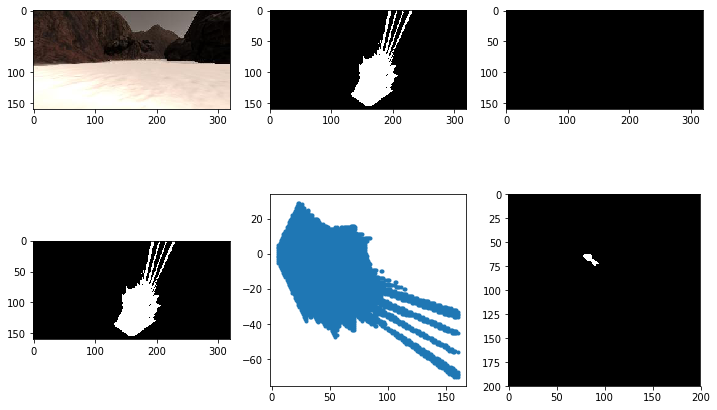

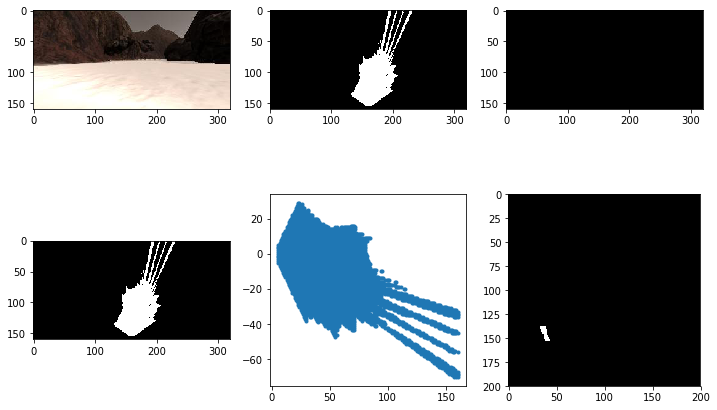

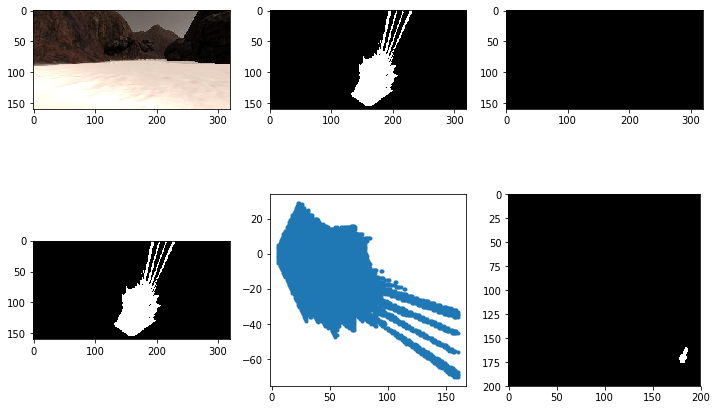

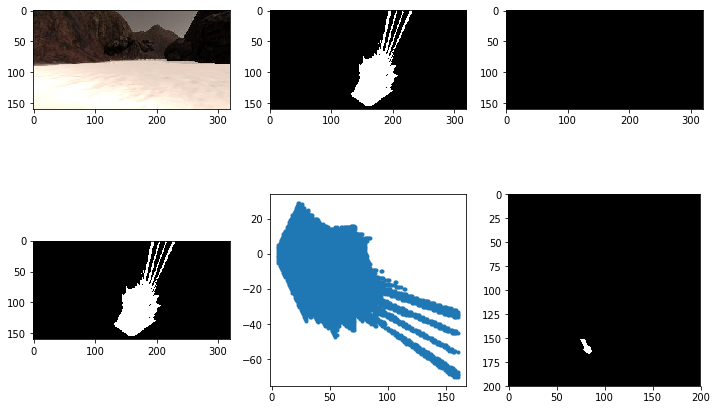

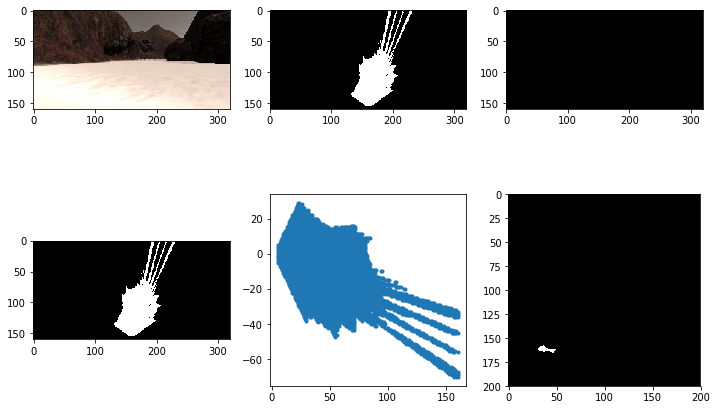

...

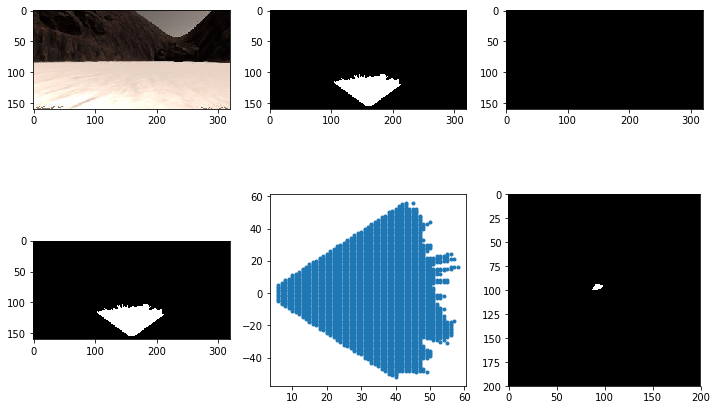

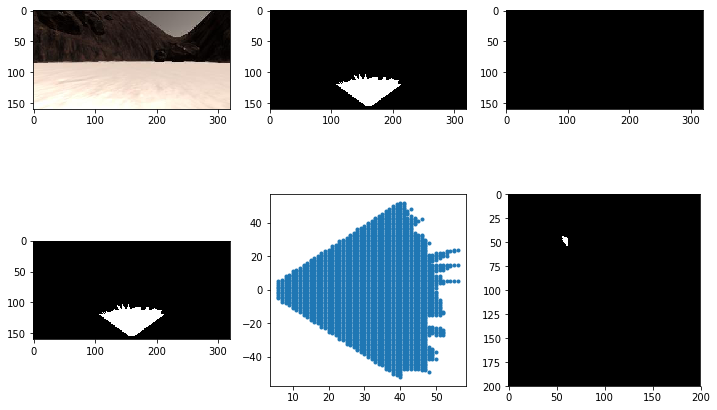

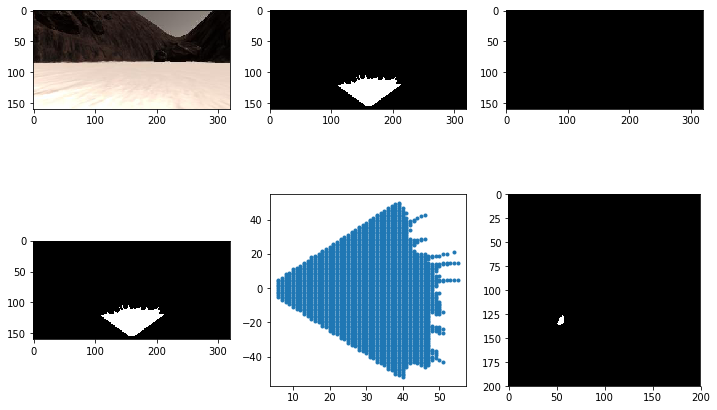

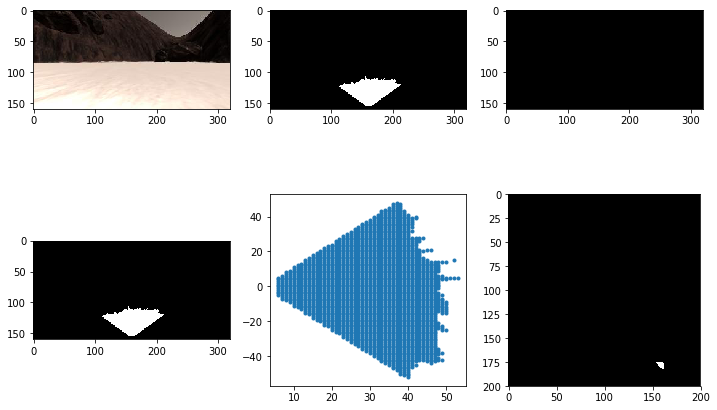

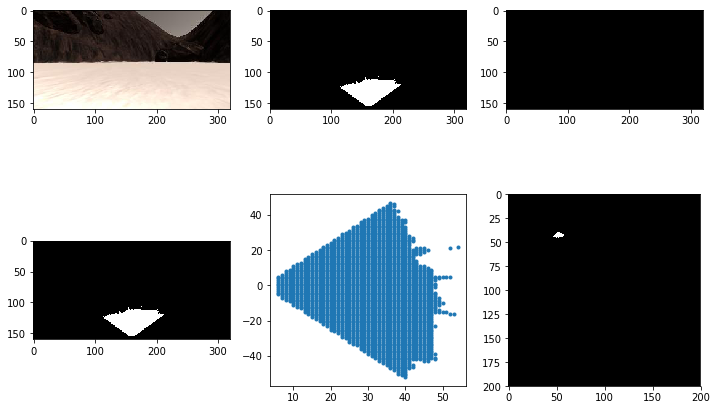

In [62]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from moviepy.editor import ImageSequenceClip


# Define pathname to save the output video
output = '../output/test_mapping.mp4'
data = Databucket() # Re-initialize data in case you're running this cell multiple times
clip = ImageSequenceClip(data.images, fps=60) # Note: output video will be sped up because 
                                          # recording rate in simulator is fps=25
new_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
%time new_clip.write_videofile(output, audio=False)

### This next cell should function as an inline video player
If this fails to render the video, try running the following cell (alternative video rendering method).  You can also simply have a look at the saved mp4 in your `/output` folder

In [63]:

from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

### Below is an alternative way to create a video in case the above cell did not work.

In [64]:
import io
import base64
video = io.open(output, 'r+b').read()
encoded_video = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded_video.decode('ascii')))